<img src="http://oci02.img.iteso.mx/identidad_de_instancia_2018/ITESO/Logos%20ITESO/Logo-ITESO-Principal.jpg">

<center> <font color= #004A94> <font size = 6> Msc Ciencia de datos </font> <br> <br> <font color= #047CFB> <font size = 5>I.F. Juan Francisco Muñoz Elguezabal</font> <br> <br>

<center><font color= #42c29b> <font size = 6> Análisis Estadístico Multivariable </font> <br> <br> <font color= #047CFB> <font size = 5> Exámen parcial 1 </font>

---

In [1]:
import pandas as pd                                       # dataframes y utilidades
import numpy as np                                        # operaciones matematicas
from IPython.display import Image

## Ejercicio 1

Para la base de datos de Agresividad donde se miden los índices de reactividad interpersonal. 

In [2]:
df_datos = pd.read_excel('archivos/Agresividad.xlsx')
df_datos_l = df_datos
columnas = df_datos.columns
df_datos_l.columns = ['c_' + str(i) for i in range(0, len(df_datos.columns))]
df_datos_l = df_datos_l.iloc[:, 9:]

In [3]:
df_datos_l.head()

,c_9,c_10,c_11,c_12,c_13,c_14,c_15,c_16,c_17,c_18,...,c_65,c_66,c_67,c_68,c_69,c_70,c_71,c_72,c_73,c_74
0,4,4,4,4,4,4,4,3,3,4,...,4,4,1,23,30,33,28,24,32,28
1,5,5,5,4,5,4,4,2,4,5,...,3,3,4,19,30,25,14,4,10,17
2,4,4,3,3,3,3,2,2,2,3,...,2,3,3,28,41,38,26,16,24,28
3,4,4,2,4,1,4,2,5,3,4,...,3,2,3,21,31,20,4,1,8,19
4,1,1,3,5,5,5,4,4,4,3,...,2,2,2,23,37,35,23,21,24,20


### A) Calcule las medidas de tendencia central y de una interpretación de los resultados obtenidos para UNA de las variables. Considere que para valores grandes en las observaciones mayor es el índice de reactividad.

In [4]:
columna = columnas[67]
columna = 'c_' + str(67)

debido a que no se cuenta con una descripción detallada de estos datos y el proceso a través del cual se recabaron, interpreto la columna elegida como la cantidad de ocasiones, durante un periodo definido, en el que las personas sintieron o que se describe en el título de la columna.

In [5]:
df_datos[columna].mean()

2.9116809116809117

Las personas entrevistadas sintieron ganas incontrolables de golpear a alguien, en promedio 3 veces (En cualquiera que haya sido el periodo que abarque la pregunta)

In [6]:
df_datos[columna].median()

3.0

Los valores de esta columna, siendo ordenados de manera ascendente o descentende, el valor de en medio (o el promedio de ambos en caso de que el total de valores sea un número par) fue de 3 ocasiones. Esto representa un valor similar a la media, con la diferencia que no se ve afectado por valores atípicos en los extremos. Al ser mayor a la media, podría pensarse que es un indicativo que existe más "densidad" de valores menores a 3 que mayores a 3.

In [7]:
df_datos[columna].mode()

0    3
dtype: int64

In [8]:
df_datos[columna].describe() 

count    351.000000
mean       2.911681
std        1.365140
min        0.000000
25%        2.000000
50%        3.000000
75%        4.000000
max        5.000000
Name: c_67, dtype: float64

la respuesta más frecuente fue de "3 ocasiones"

### B) Calcule las medidas de dispersión univariantes. ¿Qué representa la varianza y la desviación estándar?

In [9]:
df_datos[columna].std()

1.365139561951826

es la suma de las diferencias entre cada valor y el promedio de todos los valores, indica que tan dispersas están cada una de las medidas respecto al promedio de estas.

In [10]:
df_datos[columna].var()

1.8636060236060237

### C) Calcular las medidas de dispersión bivariantes.

#### Matriz de correlación

In [11]:
df_corr = df_datos_l.corr()
ar_corr = np.array(df_corr)
# Recortado para visualizar solo 10 columnas y 10 filas
df_corr.iloc[0:10, 0:10]

,c_9,c_10,c_11,c_12,c_13,c_14,c_15,c_16,c_17,c_18
c_9,1.000000,0.704789,0.397457,0.225531,0.252615,0.159606,0.085299,0.224462,0.243428,0.319258
c_10,0.704789,1.000000,0.528679,0.338349,0.403467,0.245325,0.123105,0.290930,0.292198,0.336219
c_11,0.397457,0.528679,1.000000,0.412297,0.405703,0.267929,0.119636,0.250082,0.287387,0.375406
c_12,0.225531,0.338349,0.412297,1.000000,0.475300,0.424856,0.049002,0.171530,0.275256,0.261362
c_13,0.252615,0.403467,0.405703,0.475300,1.000000,0.373318,0.166254,0.248834,0.326524,0.351269
c_14,0.159606,0.245325,0.267929,0.424856,0.373318,1.000000,0.274465,0.277275,0.314662,0.300695
c_15,0.085299,0.123105,0.119636,0.049002,0.166254,0.274465,1.000000,0.413613,0.240003,0.289881
c_16,0.224462,0.290930,0.250082,0.171530,0.248834,0.277275,0.413613,1.000000,0.395784,0.392517
c_17,0.243428,0.292198,0.287387,0.275256,0.326524,0.314662,0.240003,0.395784,1.000000,0.439306
c_18,0.319258,0.336219,0.375406,0.261362,0.351269,0.300695,0.289881,0.392517,0.439306,1.000000


#### Matríz de covarianza

In [12]:
df_cov = df_datos_l.cov()
ar_cov = np.array(df_cov)
# Recortado para visualizar solo 10 columnas y 10 filas
df_cov.iloc[0:10, 0:10]

,c_9,c_10,c_11,c_12,c_13,c_14,c_15,c_16,c_17,c_18
c_9,1.648498,1.145470,0.619243,0.375800,0.388278,0.260195,0.135263,0.346422,0.394554,0.501148
c_10,1.145470,1.602361,0.812080,0.555840,0.611404,0.394302,0.192462,0.442678,0.466927,0.520334
c_11,0.619243,0.812080,1.472495,0.649296,0.589353,0.412812,0.179300,0.364778,0.440236,0.556939
c_12,0.375800,0.555840,0.649296,1.684265,0.738437,0.700090,0.078543,0.267586,0.450956,0.414693
c_13,0.388278,0.611404,0.589353,0.738437,1.433114,0.567448,0.245812,0.358071,0.493455,0.514115
c_14,0.260195,0.394302,0.412812,0.700090,0.567448,1.612177,0.430411,0.423191,0.504363,0.466781
c_15,0.135263,0.192462,0.179300,0.078543,0.245812,0.430411,1.525389,0.614050,0.374196,0.437713
c_16,0.346422,0.442678,0.364778,0.267586,0.358071,0.423191,0.614050,1.444900,0.600578,0.576842
c_17,0.394554,0.466927,0.440236,0.450956,0.493455,0.504363,0.374196,0.600578,1.593618,0.678014
c_18,0.501148,0.520334,0.556939,0.414693,0.514115,0.466781,0.437713,0.576842,0.678014,1.494717


### D) ¿Qué variables presentan correlación directa y qué variables presentan correlación inversa?

In [13]:
pos = np.where(df_corr <0)
pos

(array([ 0,  0,  0, ..., 65, 65, 65]), array([31, 43, 45, ..., 59, 60, 61]))

In [14]:
df_corr.iloc[58:60, 0:2]

,c_9,c_10
c_67,0.105844,0.004951
c_68,0.643605,0.741837


### E) ¿Qué variables presentan la mayor y  la menor correlación?

### Mayor

In [15]:
mayor = np.unravel_index(np.argmax(np.tril(df_corr, -1), axis=None), df_corr.shape)
'fueron: ' + columnas[int(df_corr.index[mayor[0]][2:])] + ' con: ' + columnas[int(df_corr.index[mayor[1]][2:])]

'fueron: Empatía con: Me siento bien ayudando a otros que lo necesitan'

### Menor

In [16]:
menor = np.unravel_index(np.argmin(np.tril(df_corr, -1), axis=None), df_corr.shape)
'fueron: ' + columnas[int(df_corr.index[menor[0]][2:])] + ' con: ' + columnas[int(df_corr.index[menor[1]][2:])]

'fueron: Algunos de mis amigos piensan que soy una persona impulsiva con: Frecuentemente, doy tiempo o dinero a organizaciones que ayudan a la gente'

### F) Si dos variables tienen correlación cero, entonces ¿se puede concluir qué son independientes? Justifica tu respuesta.

Me parece que si dos variables aleatorias  son independientes entre si, sí están incorrelacionadas (o su coeficiente de correlación puede ser 0). Sin embargo, no creo que el inverso se sostenga, esto es, que el hecho de que dos variables aleatorias no estén correlacionadas no siempre serán independientes. Mas sobre esto, para mi la correlación es una medida que se restringe a relaciones lineales, independencia es más una medida de un efecto de naturaleza probabilistica lo cual involucra mas cosas que una simple asociación lineal.

## Ejercicio 2

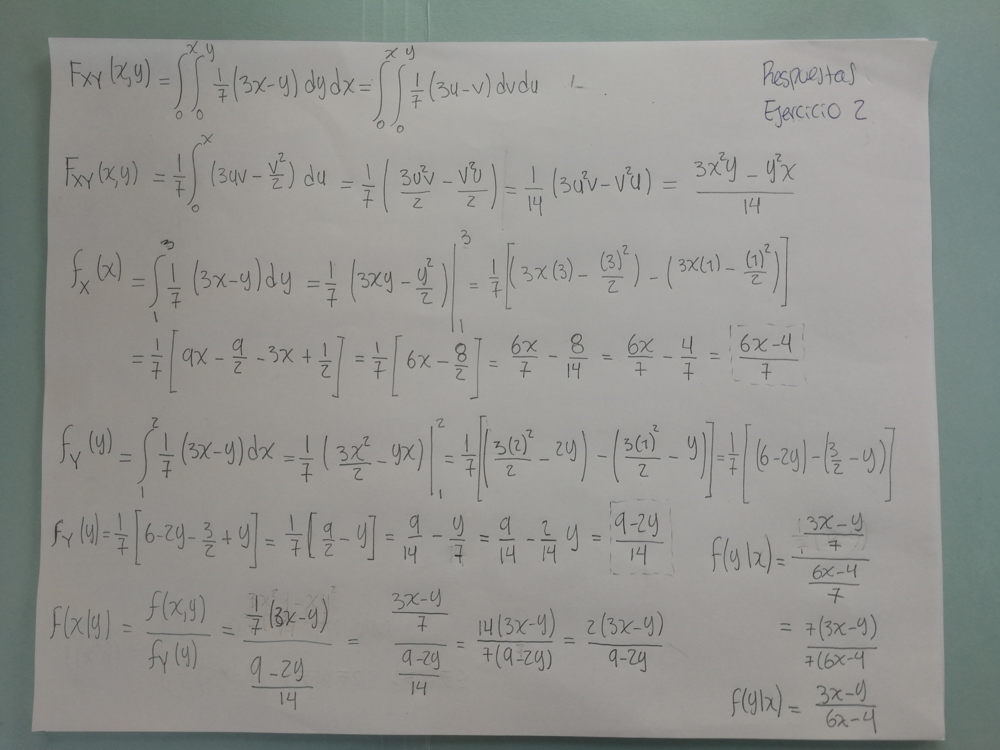

In [17]:
Image('IMG_20191027_101548.jpg')

## Ejercicio 3

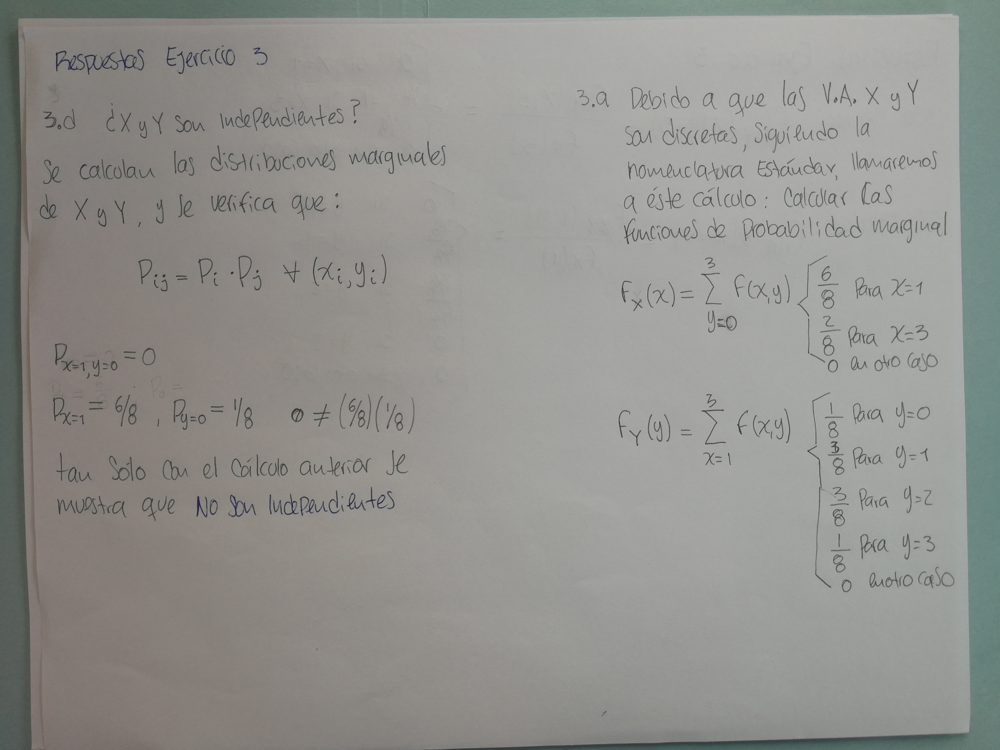

In [18]:
Image('IMG_20191027_101633.jpg')

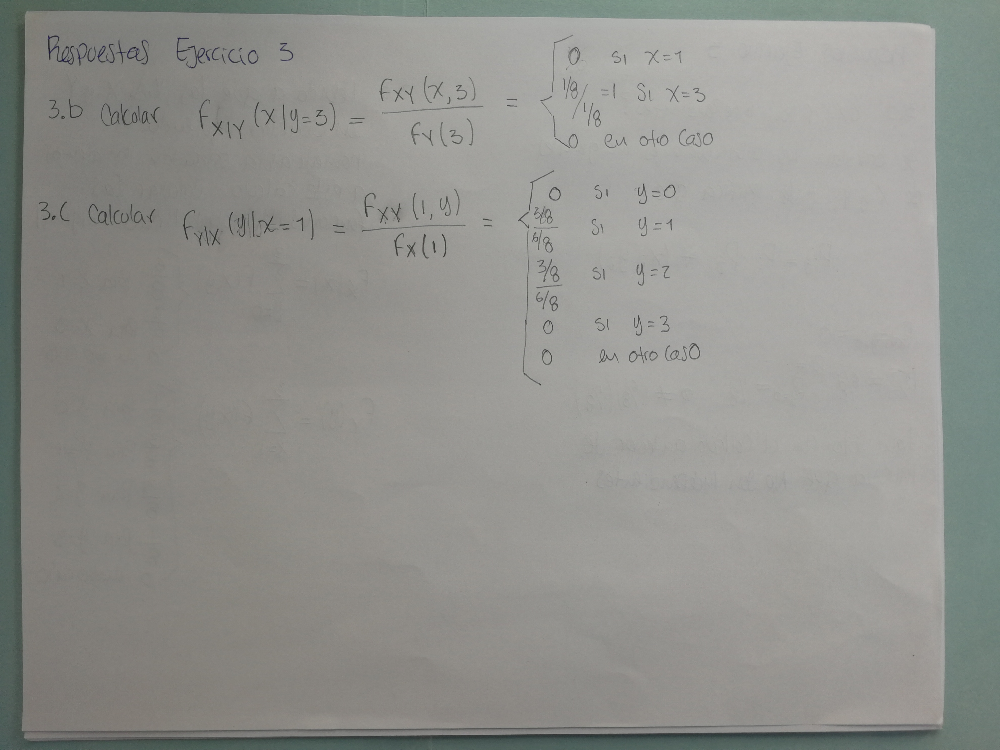

In [19]:
Image('IMG_20191027_101857.jpg')

## Ejercicio 4

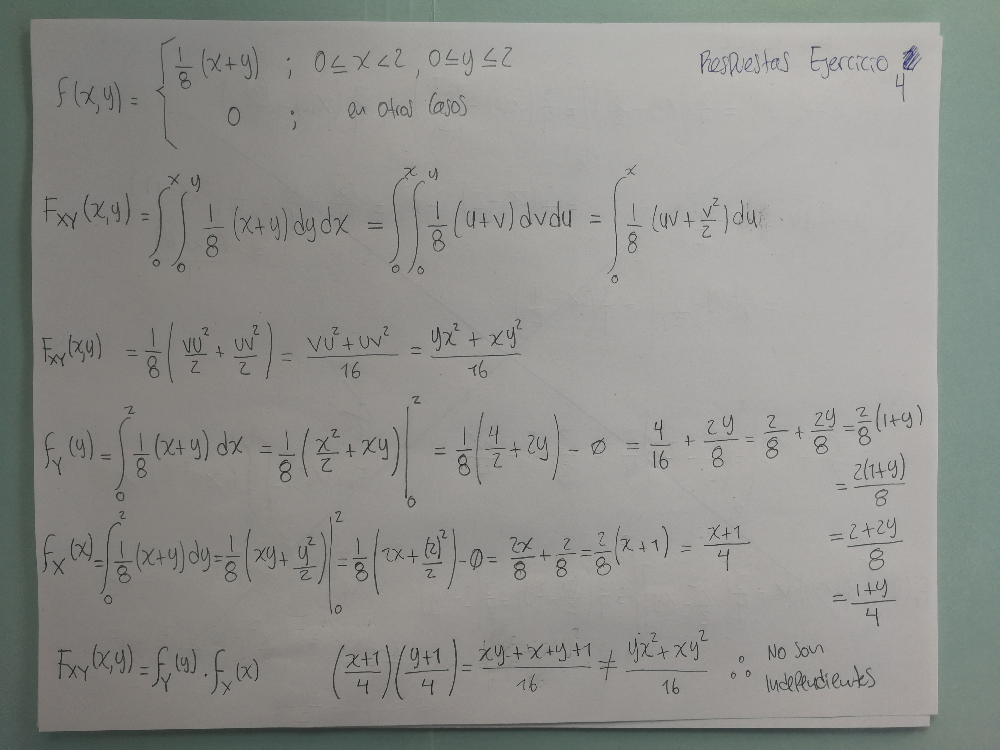

In [20]:
Image('IMG_20191027_101829.jpg')